In [10]:
import pandas as pd
import json
import os

from sdv.metadata import Metadata
from sdv.evaluation.single_table import get_column_plot, get_column_pair_plot

In [11]:
# config
DATASET = "adult"
SYN_MODEL = "vae-bgm"

output_folder_cat = f"../results/plots/{DATASET}/{SYN_MODEL}/categorial"
output_folder_num = f"../results/plots/{DATASET}/{SYN_MODEL}/numerical"

#os.makedirs(output_folder_cat, exist_ok=True)
#os.makedirs(output_folder_num, exist_ok=True)

In [12]:
real_path = f"../data/processed/{DATASET}/train_balanced.csv"
syn_path = "../sdg-models/vae-bgm/data_generation/output_generator/adult/bgm/5_50/seed_0/raw_gen_data.csv"


df_real = pd.read_csv(real_path)
df_syn = pd.read_csv(syn_path)

# load info json
#with open("../sdg-models/tabsyn/data/info/adult.json", "r") as f:
#        info = json.load(f)

In [13]:
metadata = Metadata.detect_from_dataframe(df_real)

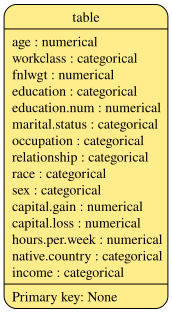

In [14]:
metadata.visualize()

In [18]:
# adult
cat_cols = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country', 'income']
#num_cols = ['age', 'fnlwgt', 'education.num', 'capital.gain', 'capital.loss', 'hours.per.week']
num_cols = ['age', 'fnlwgt', 'capital.gain', 'capital.loss', 'hours.per.week']

# yeast
#num_cols = ["mcg", "gvh", "alm", "mit", "erl", "pox", "vac", "nuc"]

## Plots for categorical Columns

In [16]:
for col in cat_cols:
    fig_cat = get_column_plot(
    real_data = df_real,
    synthetic_data = df_syn,
    metadata = metadata,
    column_name = col 
    )
    #fig_cat.write_image(f"{output_folder_cat}/{col}.png")
    fig_cat.show()

## Plots for Continous Columns

In [19]:
for col in num_cols:
    fig_num = get_column_plot(
        real_data = df_real,
        synthetic_data = df_syn,
        metadata = metadata,
        column_name = col 
    )
    #fig_cat.write_image(f"{output_folder_num}/{col}.png")
    fig_num.show()

## correlation matrix

In [57]:
from dython.nominal import compute_associations
import seaborn as sns
import matplotlib.pyplot as plt
import json

In [58]:
DATASET = "adult"
SDG = "ctgan"

real_path = f"../data/processed/{DATASET}/train_min.csv"
syn_path = f"../data/synthetic/{DATASET}/{SDG}.csv"

df_real = pd.read_csv(real_path)
df_syn = pd.read_csv(syn_path)

# load info json
with open(f"../data/info/{DATASET}.json", "r") as f:
    info = json.load(f)

target = info["target_col"] 

In [65]:
# pre process columns for correlation 
## remove categorcial columns with more then 2 categories, since label encoding would implicagte a order,
## which is not the case


workclass
6
education
15
marital.status
7
occupation
14
relationship
6
race
5
sex
2
native.country
39


In [67]:
df_real["native.country"].value_counts()

native.country
United-States         7171
Philippines             61
Germany                 44
India                   40
Canada                  39
Mexico                  33
England                 30
Italy                   25
Cuba                    25
Japan                   24
Taiwan                  20
China                   20
Iran                    18
South                   16
Puerto-Rico             12
Poland                  12
France                  12
Jamaica                 10
El-Salvador              9
Greece                   8
Cambodia                 7
Hong                     6
Yugoslavia               6
Ireland                  5
Vietnam                  5
Portugal                 4
Haiti                    4
Ecuador                  4
Thailand                 3
Hungary                  3
Guatemala                3
Scotland                 3
Nicaragua                2
Trinadad&Tobago          2
Laos                     2
Columbia                 2
Dominican-Rep

In [70]:
df_real[df_real["native.country"] == "Iran"]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
34,38.0,Federal-gov,125933.0,Masters,14.0,Married-civ-spouse,Prof-specialty,Husband,White,Male,0.0,0.0,40.0,Iran,>50K
54,41.0,Private,180138.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,50.0,Iran,>50K
335,40.0,Self-emp-not-inc,266324.0,Some-college,10.0,Divorced,Exec-managerial,Other-relative,White,Male,0.0,1564.0,70.0,Iran,>50K
660,34.0,Private,213226.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Husband,White,Male,0.0,0.0,40.0,Iran,>50K
841,51.0,Private,293196.0,Doctorate,16.0,Married-civ-spouse,Prof-specialty,Husband,White,Male,15024.0,0.0,60.0,Iran,>50K
842,45.0,Private,214627.0,Doctorate,16.0,Widowed,Prof-specialty,Unmarried,White,Male,15020.0,0.0,40.0,Iran,>50K
1012,36.0,Private,95654.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,White,Female,0.0,0.0,50.0,Iran,>50K
1071,52.0,State-gov,149650.0,Doctorate,16.0,Married-civ-spouse,Prof-specialty,Husband,White,Male,0.0,0.0,40.0,Iran,>50K
1521,40.0,Self-emp-inc,157240.0,Masters,14.0,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024.0,0.0,30.0,Iran,>50K
2338,33.0,Private,181091.0,Bachelors,13.0,Married-civ-spouse,Adm-clerical,Husband,White,Male,0.0,0.0,60.0,Iran,>50K


In [50]:
real_corr = df_real.corr()
syn_corr = df_syn.corr()

ValueError: could not convert string to float: 'Self-emp-not-inc'

In [24]:
real_corr

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
age,1.0,0.238632,-0.068277,0.164399,-0.022411,0.211244,0.191638,0.145113,0.049869,0.084962,0.054473,0.016824,-0.127006,0.096465,0.0
workclass,0.238632,1.0,0.027158,0.126173,0.151132,0.02426,0.465895,0.052316,0.05561,0.119456,0.113022,0.041374,0.191554,0.026637,0.0
fnlwgt,-0.068277,0.027158,1.0,0.053365,-0.002573,0.045676,0.077863,0.022306,0.118996,0.017714,0.005543,-0.00333,-0.001055,0.109944,0.0
education,0.164399,0.126173,0.053365,1.0,1.0,0.04547,0.186821,0.058713,0.053708,0.06372,0.178113,0.081554,0.10095,0.133809,0.0
education.num,-0.022411,0.151132,-0.002573,1.0,1.0,0.111599,0.584477,0.101441,0.080187,0.030948,0.106002,0.061825,0.060773,0.159457,0.0
marital.status,0.211244,0.02426,0.045676,0.04547,0.111599,1.0,0.060582,0.46822,0.027924,0.261834,0.056619,0.028579,0.064145,0.035434,0.0
occupation,0.191638,0.465895,0.077863,0.186821,0.584477,0.060582,1.0,0.13384,0.063765,0.284914,0.100181,0.065301,0.246443,0.040323,0.0
relationship,0.145113,0.052316,0.022306,0.058713,0.101441,0.46822,0.13384,1.0,0.055348,0.854583,0.055484,0.032718,0.224465,0.061708,0.0
race,0.049869,0.05561,0.118996,0.053708,0.080187,0.027924,0.063765,0.055348,1.0,0.061328,0.02689,0.015774,0.026139,0.402828,0.0
sex,0.084962,0.119456,0.017714,0.06372,0.030948,0.261834,0.284914,0.854583,0.061328,1.0,0.005609,0.015086,0.192779,0.03026,0.0


In [25]:
syn_corr

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
age,1.0,0.162805,-0.07083,0.248107,0.004557,0.08097,0.135154,0.156576,0.071627,0.107453,0.037112,0.028591,0.059003,0.089885,0.0
workclass,0.162805,1.0,0.087216,0.163142,0.185246,0.090991,0.217338,0.140774,0.074545,0.26457,0.085229,0.04428,0.137411,0.057591,0.0
fnlwgt,-0.07083,0.087216,1.0,0.209784,0.018826,0.061986,0.114084,0.097527,0.046157,0.073862,-0.022073,-0.002365,0.018579,0.074448,0.0
education,0.248107,0.163142,0.209784,1.0,0.544436,0.117673,0.162906,0.150196,0.129878,0.265941,0.107935,0.083661,0.1283,0.085103,0.0
education.num,0.004557,0.185246,0.018826,0.544436,1.0,0.133664,0.403923,0.158276,0.143856,0.149007,0.066736,0.041591,-0.000061,0.117017,0.0
marital.status,0.08097,0.090991,0.061986,0.117673,0.133664,1.0,0.087614,0.3528,0.050326,0.169325,0.133007,0.021378,0.074691,0.059862,0.0
occupation,0.135154,0.217338,0.114084,0.162906,0.403923,0.087614,1.0,0.179613,0.142754,0.314626,0.089493,0.062552,0.11837,0.071633,0.0
relationship,0.156576,0.140774,0.097527,0.150196,0.158276,0.3528,0.179613,1.0,0.073848,0.643526,0.122296,0.048322,0.229115,0.07525,0.0
race,0.071627,0.074545,0.046157,0.129878,0.143856,0.050326,0.142754,0.073848,1.0,0.115977,0.02767,0.028341,0.059761,0.300929,0.0
sex,0.107453,0.26457,0.073862,0.265941,0.149007,0.169325,0.314626,0.643526,0.115977,1.0,0.02787,0.028757,0.20293,0.088176,0.0


In [42]:
abs_diff_corr = abs(real_corr - syn_corr)

In [46]:
abs_diff_corr = abs_diff_corr.astype(float)

In [47]:
abs_diff_corr

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
age,0.000000,0.075827,0.002553,0.083708,0.026968,0.130274,0.056483,0.011463,0.021758,0.022491,0.017361,0.011767,0.186009,0.006581,0.0
workclass,0.075827,0.000000,0.060058,0.036969,0.034115,0.066731,0.248557,0.088458,0.018935,0.145114,0.027793,0.002905,0.054143,0.030954,0.0
fnlwgt,0.002553,0.060058,0.000000,0.156419,0.021399,0.016310,0.036221,0.075221,0.072839,0.056148,0.027616,0.000965,0.019633,0.035496,0.0
education,0.083708,0.036969,0.156419,0.000000,0.455564,0.072203,0.023915,0.091483,0.076171,0.202221,0.070178,0.002107,0.027349,0.048706,0.0
education.num,0.026968,0.034115,0.021399,0.455564,0.000000,0.022065,0.180554,0.056836,0.063669,0.118060,0.039267,0.020234,0.060834,0.042439,0.0
marital.status,0.130274,0.066731,0.016310,0.072203,0.022065,0.000000,0.027032,0.115419,0.022402,0.092509,0.076388,0.007201,0.010546,0.024428,0.0
occupation,0.056483,0.248557,0.036221,0.023915,0.180554,0.027032,0.000000,0.045773,0.078989,0.029712,0.010688,0.002749,0.128073,0.031309,0.0
relationship,0.011463,0.088458,0.075221,0.091483,0.056836,0.115419,0.045773,0.000000,0.018500,0.211057,0.066812,0.015605,0.004650,0.013542,0.0
race,0.021758,0.018935,0.072839,0.076171,0.063669,0.022402,0.078989,0.018500,0.000000,0.054648,0.000780,0.012567,0.033622,0.101899,0.0
sex,0.022491,0.145114,0.056148,0.202221,0.118060,0.092509,0.029712,0.211057,0.054648,0.000000,0.022261,0.013672,0.010151,0.057916,0.0


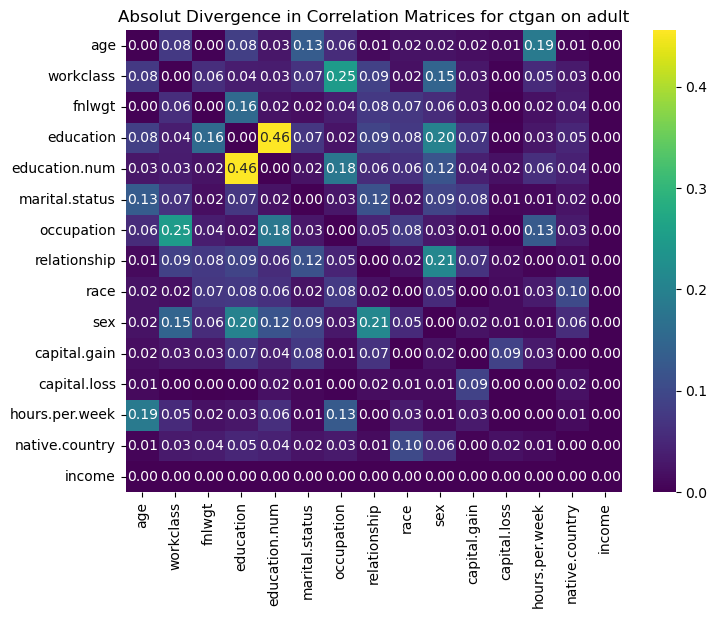

In [49]:
plt.figure(figsize=(8,6))
sns.heatmap(abs_diff_corr, annot=True, cmap="viridis", fmt=".2f", cbar=True)
plt.title(f"Absolut Divergence in Correlation Matrices for {SDG} on {DATASET}")
plt.show()